#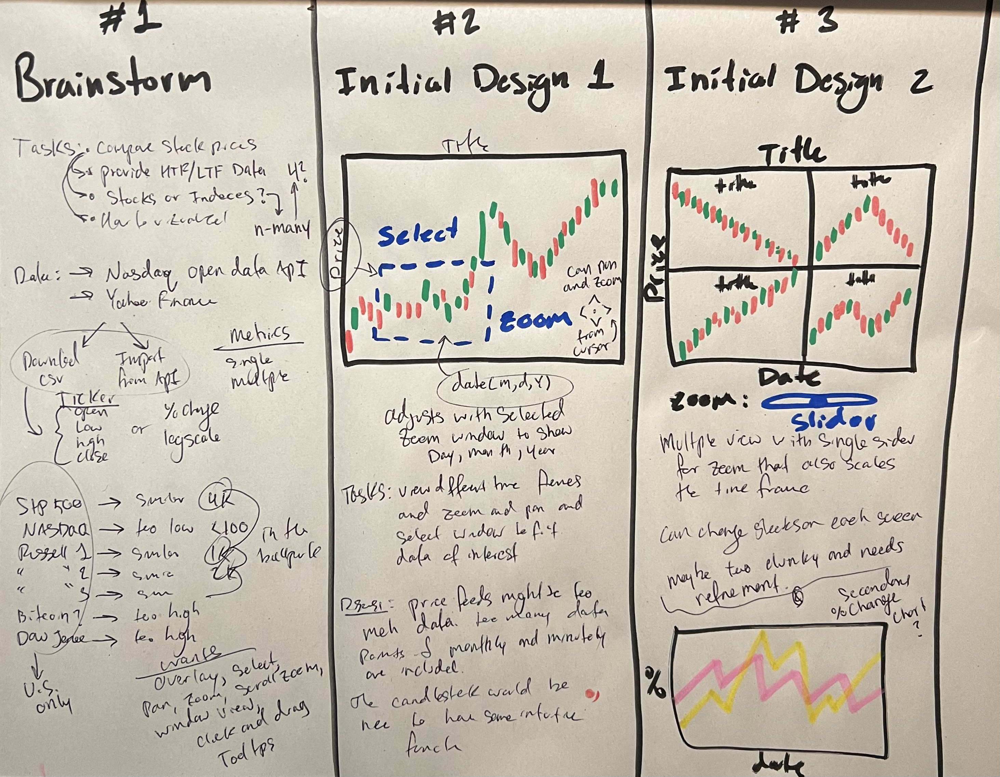Fundamentals of Data Visualization Final Project

###Part 1: Curating the Data

I decided to explore and visualize stock market data from Yahoo Finance, which provides live and historical market data that can be accessed remotely using Yahoo Finance API and the Pandas DataReader package. I specifically am interested in the intraday movement of various stock market indexes, namely the S&P 500, an index tracking the stock performance of 500 of the largest companies listed on US stock exchanges; the Russell 3000, an index tracking the stocks of the largest 3,000 companies; the Russell 1000, a sub-index tracking the top 1,000 stocks in the Russell 3000; and the Russell 2000, another sub-index tracking the bottom 2,000 companies included in the Russell 3000. The data set, which was curated by importing the data for each index individually, includes the open, close, high, and low daily prices for each index as well as the index ticker mid-point price.


My goal with the data is to facilitate the exploration and comparison of index prices over a specific timeframe. Most people interested in the stock market value the ability to scrub through stock price data visualizations that relay information like the open price and close price, especially for comparison between financial instruments. So, in response, I would like to answer the question asking how the selected indexes compare, and how they may differ on a macro scale due to their composition and chosen stocks. The best example of a visualization that works wonderfully is candlestick charts for price data, but they typically lack the ability to superimpose charts or select areas to view closer, which is something that I would like to add to improve this type of visualization. Thus, my design for a visualization is centered around the task of market price research.


The data is limited to choosing one time frame at a time upon import, and so, to minimize computational stress, only one time frame was chosen for each market index. Choosing only the daily timeframe for the visualization was a necessity to get the best results from Altair visualizations. Additionally, some interesting metrics like the mid-point between the high and low prices and the index symbol were not included in the data set. This was rectified through the data curation and cleaning process. Moreover, to stay under the 5,000 data points mark, only data strictly between 31 December 2021 and 1 January 2023 was considered for the visualization. Overall, the limitations on the data are not expected to affect the efficacy of the visualization to meet the demands of the task.

###Part 2: Sketching the Data

Previously, I identified high-level goals for working with the Yahoo Finance dataset that were of interest based on existing visualizations and functionality critical to interacting with market data. Here, I expand on the aforementioned goals so that the target problem at hand can be more illustratively characterized through a delineation of tasks and low-fidelity sketches of the planned visualization.


The first task that I will complete with my data is analyze and compare the price history of various market indexes over the year 2022. The goal of this task is to present data in a way that allows for easy comparison. To do so, the visualization will show multiple candlestick price charts superimposed on the same graph while still allowing the user to view individual charts. The characteristics that are critical to this task are the date and price information that describe the graphs and their behavior over the year of 2022 fixed at a frequency of one day per price measurement. Further, the chart will show complete summary data at each data point upon hover to allow for more convenient comparison of the data. Ideally, the chart will allow for the task to be completed continuously and upon single chart selection as the user explores and compares the market indexes.


The other task that I will complete with my data is to allow for easy manipulation of the field of view, which gives impetus to the goal of being able to select which data is shown on the chart and improve the convenience of the chart. To do this, the user will be able to drag a selection window over the chart to zoom in or highlight specific points of interest, at which point the chart would resize accordingly, in both the x and y direction, and allow the user to hover over data points for more information. The user, or data analyst, using the chart will be able to dive deeper into the data after giving initial attention to the bigger picture.


Included here are images of the initial, low-fidelity prototypes of the described tasks drawn by hand.

###Part 3: Implementation
Below, I implement the visualization to the specifications detailed above:

In [ ]:
# Install/Update Packages
!pip install -U altair
!pip install -U pyarrow

In [ ]:
# Import Packages
import numpy as np; import pandas as pd
from pandas_datareader import data as pdr
import yfinance as yfin; import altair as alt

In [ ]:
# Configure Dataset
yfin.pdr_override(); start = '2022-01-01'; end = '2023-01-01'; interval = '1d'

# Read in Data
GSPC = pdr.DataReader('^GSPC', start=start,\
                      end=end, interval=interval).reset_index()
RUS1 = pdr.DataReader('^RUI', start=start, \
                      end=end, interval=interval).reset_index()
RUS2 = pdr.DataReader('^RUT', start=start, \
                      end=end, interval=interval).reset_index()
RUS3 = pdr.DataReader('^RUA', start=start, \
                      end=end, interval=interval).reset_index()

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [ ]:
# Calculate Midpoint Price
GSPC['Mid'] = (GSPC['High'] - GSPC['Low'])/2 + GSPC['Low']
RUS1['Mid'] = (RUS1['High'] - RUS1['Low'])/2 + RUS1['Low']
RUS2['Mid'] = (RUS2['High'] - RUS2['Low'])/2 + RUS2['Low']
RUS3['Mid'] = (RUS3['High'] - RUS3['Low'])/2 + RUS3['Low']

# Include Ticker in Data
GSPC['Symbol'] = 'S&P 500'; RUS1['Symbol'] = 'Russell 1000'
RUS2['Symbol'] = 'Russell 2000'; RUS3['Symbol'] = 'Russell 3000'

# Create Data Frame
findex_1d = pd.concat(
    [GSPC[['Date','Open','High','Low','Close','Symbol','Mid']],
     RUS1[['Date','Open','High','Low','Close','Symbol','Mid']],
     RUS2[['Date','Open','High','Low','Close','Symbol','Mid']],
     RUS3[['Date','Open','High','Low','Close','Symbol','Mid']]],
     axis=0)

findex_1d.head()

,Date,Open,High,Low,Close,Symbol,Mid
0,2022-01-03,4778.140137,4796.640137,4758.169922,4796.560059,S&P 500,4777.405029
1,2022-01-04,4804.509766,4818.620117,4774.270020,4793.540039,S&P 500,4796.445068
2,2022-01-05,4787.990234,4797.700195,4699.439941,4700.580078,S&P 500,4748.570068
3,2022-01-06,4693.390137,4725.009766,4671.259766,4696.049805,S&P 500,4698.134766
4,2022-01-07,4697.660156,4707.950195,4662.740234,4677.029785,S&P 500,4685.345215


In [ ]:
# Brush to Interact with Chart
brush = alt.selection_interval(encodings=['x','y'])

# Color Code for Price Movement
color_conditions = alt.condition("datum.Open <= datum.Close",
                                 alt.value("green"),
                                 alt.value("red"))
# Options for Radio Buttons
options = ['S&P 500', 'Russell 1000', 'Russell 2000', 'Russell 3000']
labels = [option + ' ' for option in options]

radio_buttons = alt.binding_radio(
    options=options + [None],labels=labels + ['All'],name='Index: ')

selection = alt.selection_point(fields=['Symbol'],bind=radio_buttons)

# Create brush-able top chart
top_chart = alt.Chart(findex_1d).mark_line().encode(
    x='Date:T',y='Mid:Q',
    color=alt.Color('Symbol').scale(domain=options)
).properties(width=800,height=300
).add_params(brush,selection
).transform_filter(selection
)

# Create linked/responding bottom chart
bottom_chart = alt.Chart(findex_1d).mark_line(size=0.5).encode(
    x='Date:T',y='Mid:Q',
    tooltip=["Date","Open","High","Low","Close","Mid"],
    color=alt.Color('Symbol').scale(domain=options)
).transform_filter(brush
).transform_filter(selection
).properties(width=800,height=300
)

# Create bars for candlestick effect
bars = bottom_chart.mark_bar(size=5).encode(y="Open:Q", y2="Close:Q",
                                            color = color_conditions)

# Create rules for candlestick effect
rules = bottom_chart.mark_rule().encode(y = "Low:Q",y2 = "High:Q")

# Arrange both charts vertically, add title, make bottom interactive
final_chart = \
  top_chart.properties(title='Market Index Comparison Y2022') \
  & bottom_chart + rules + bars.interactive()

# Show  final chart
final_chart

alt.VConcatChart(...)

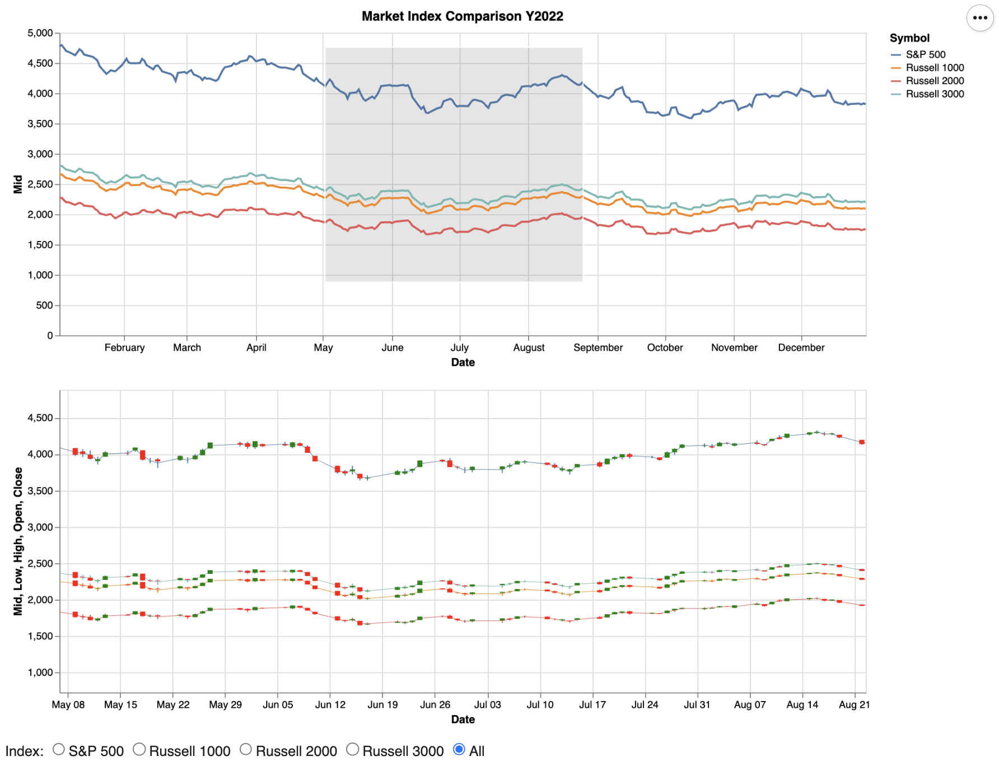

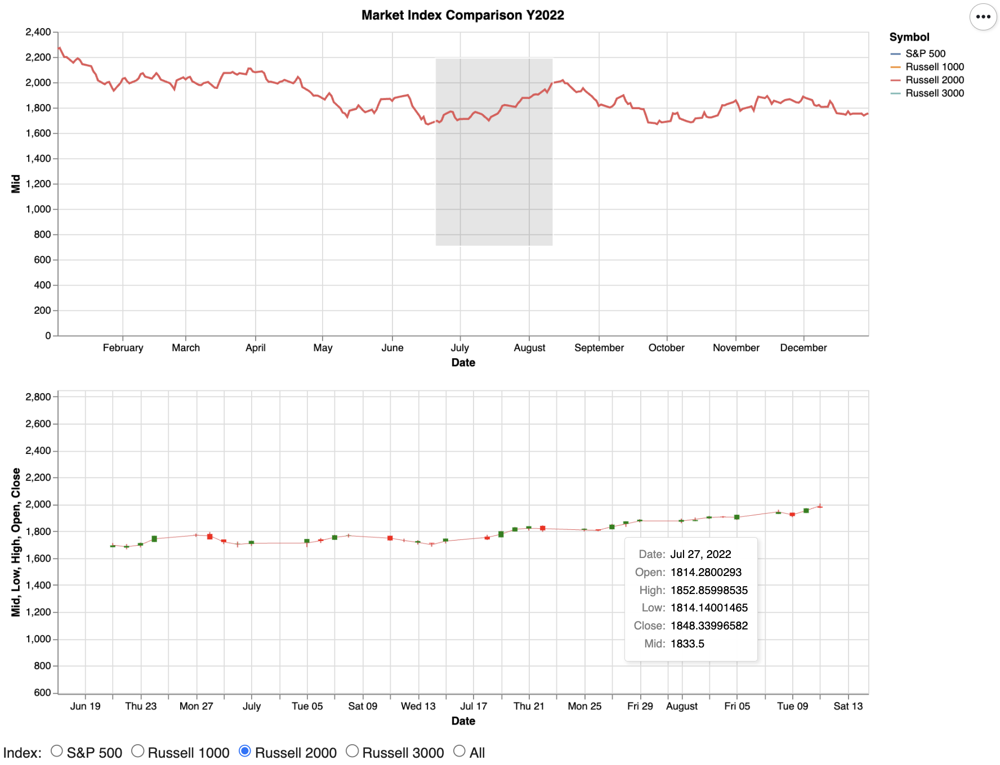

As described above, the visualization design implementation includes a few key elements:


1. the ability to choose which graph to view, or view all graphs at once
2. the ability to select a view window and have the axes scale to the selection
3. the ability to select a view and see only the selected data
4. the ability to hover over data points and get informational price summaries
5. the ability to interact intuitively, i.e. zoom and pan, with the graph


The justification for each falls under the goals for the task determination for the visualization. All 5 elements contribute to a comprehensive interactive graph of financial data that allows the user to conveniently choose the data that is of interest and compare financial instruments.


Some elements that have been eliminated due to practicality and other limiting factors such as the inability to use more than 5000 data points include the ability to choose different time frames. This was not mentioned in the delineation of tasks in Part 1 because it was an issue that was assumed from the beginning. Though, a full-fledged and improved visualization would allow for such analysis. Further improvements would key-in on solutions to this issue.


###Evaluation

Now that the tasks for the visualization have been implemented using the initial designs and goals that were generated, it is time to evaluate the visualization. The target audience for the visualization was identified to be data analysts, financial analysts, and laymen that are interested in trading or the market as a whole. Of course, the target audience gives the best perspective, so I implemented my qualitative approach to evaluate the model through a simple observational study and survey focused on obtaining raw user feedback. As I am limited in reach and could not find a financial analyst or data analyst (other than myself), I resorted to asking the sentiment of a financial planner and two layman stock traders, all family and friends. In order to carry out the observational study and survey, I allowed the user-recruits to interact with the visualization and provide their initial feedback on the functionality and value it may add to their occupation. After time elapsed, I asked them a series of questions including:


1. Is the visualization informative, and how so?
2. Would you use or recommend it to others in your profession or hobby?
3. Was the visualization a useful tool, or could you see it being a useful tool in market research?
4. Was the visualization intuitive and easy to use?
5. What could be improved about the visualization as a tool?


These questions were designed to extract qualitative information about the visualization that could be used to gauge the extent to which the visualization met the goals set out at the beginning, namely to allow a convenient and informational way to compare multiple financial instruments at once.


After conducting the evaluation, I was left with valuable data about the visualization and the overall approach taken on in this project. The most critical feedback I obtained from the qualitative evaluation included comments on the type of data, ease of use, future improvements, and overall usefulness of the visualization. Most of the recruited evaluators had mentioned that they would like to see different time frames in the data set, which is a valid critique to have. It was discussed earlier in the report that it was a technical restriction on the entire project. Only one evaluator found the visualization hard to use due to the size of the visualization and admitted poor vision. This feedback is useful in the sense that the size of the visualization is completely under my control and can be improved in future iterations. The other evaluators commented that the visualization was fun to use and had little to no issues with panning, zooming, or selecting data to view. Though, they did mention that they should be allowed to select more than one of the radio buttons at a time. Frankly, this was realized to be an issue with the visualization and hampered its overall usefulness. In this regard, the visualization was lacking in functionality and information accessibility; it is something to be improved in the next iteration. Despite this, all three noted the value of the visualization as a tool in comparing financial instruments, saying that it is much like visualizations that they use, but with a different approach that has potential if it were built out more. On the whole, the implementation was successful. The desired goals were met and the visualization was evaluated to provide value to the target user. Not without some hiccups, the tasks were successfully completed and the visualization worked as intended. Future iterations of the visualizations will show improvement in means of data selection when interacting with the visualization and include deeper data from each financial instrument.